In [1]:
import fMRIus

ModuleNotFoundError: No module named 'fMRIus'

In [3]:
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import colorConverter
from matplotlib.patches import Rectangle
import importlib
import json
import pandas as pd
from os.path import join as opj
from os.path import isdir
from sklearn.utils import Bunch
from os import listdir as lsd
from IPython import display
from IPython.display import display_html
import itertools

from nilearn import plotting
from nilearn.glm.first_level import FirstLevelModel
from nilearn.image import concat_imgs, resample_img, mean_img
from nilearn.glm import threshold_stats_img
from nilearn.plotting import plot_design_matrix, plot_event
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn import image
from nilearn import reporting
from nilearn import regions
from nilearn import surface
from nilearn.masking import apply_mask

# sys.path.append( sys.path.append('/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/') )
# sys.path.append( sys.path.append('/home/marius/ownCloud/development/python/atlasreader/atlasreader') )

# import atlasreader

# import fMRIus
from fMRIus.src import subject as fmrius_subject
from fMRIus.src.info import info as fMRIus_info

# from gm_analysis import subject
# from gm_analysis import info
# from gm_analysis import helpers as myHelpers

# from gm_analysis import first_level


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# %matplotlib widget
%matplotlib inline

ModuleNotFoundError: No module named 'fMRIus'

In [7]:
!which python

/home/marius/.virtualenvs/gaze-arrows/bin/python


In [3]:
print(fMRIus)

<module 'fMRIus' (namespace)>


In [4]:
fMRIus.src

<module 'fMRIus.src' from '/mnt/fileserv1_neurologie/Research_groups/mgoerner/projects/scientific/gaze-motion/analysis/fMRIus/src/__init__.py'>

In [5]:
fmrius_subject

<module 'fMRIus.src.subject' from '/mnt/fileserv1_neurologie/Research_groups/mgoerner/projects/scientific/gaze-motion/analysis/fMRIus/src/subject.py'>

In [6]:
fMRIus_info.func_run_dict

{'sub-00': {'ses-gc': {'MTloc': ['MTloc_run-1',
    'MTloc_run-2',
    'MTloc_run-3',
    'MTloc_run-4',
    'MTloc_run-5',
    'MTloc_run-6',
    'MTloc_run-7'],
   'gc': ['gc_run-1',
    'gc_run-2',
    'gc_run-3',
    'gc_run-4',
    'gc_run-5',
    'gc_run-6'],
   'experimental_order': ['MTloc_run-1',
    'MTloc_run-2',
    'MTloc_run-3',
    'MTloc_run-4',
    'MTloc_run-5',
    'MTloc_run-6',
    'MTloc_run-7',
    'gc_run-1',
    'gc_run-2',
    'gc_run-3',
    'gc_run-4',
    'gc_run-5',
    'gc_run-6']},
  'ses-com': {'MTloc': ['MTloc_run-1',
    'MTloc_run-2',
    'MTloc_run-3',
    'MTloc_run-4',
    'MTloc_run-5',
    'MTloc_run-6'],
   'gic': ['gic_run-1', 'gic_run-2', 'gic_run-3'],
   'co': ['co_run-1', 'co_run-2', 'co_run-3'],
   'experimental_order': ['MTloc_run-1',
    'co_run-1',
    'MTloc_run-2',
    'co_run-2',
    'co_run-3',
    'MTloc_run-3',
    'gic_run-1',
    'gic_run-2',
    'MTloc_run-4',
    'MTloc_run-5',
    'gic_run-3',
    'MTloc_run-6']}},
 'sub-0000

In [2]:
import glob

In [79]:
fmriprep_dir = '/media/marius/data/experimental_data/arrow_gaze/derivatives/fmriprep'

func_run_dict = {}

sub_dirs = [el for el in glob.glob(opj(fmriprep_dir, '*')) if isdir(el) and 'sub' in el]
sub_dirs.sort()

for s_ in sub_dirs:
    func_run_dict[s_.split('/')[-1]] = {}
    
    ses_dirs = [el for el in glob.glob(opj(s_, '*')) if isdir(el) and 'ses' in el]
    
    for ses_ in ses_dirs:
        func_run_dict[s_.split('/')[-1]][ses_.split('/')[-1]] = {}
        
        ses_files = glob.glob(opj(ses_, 'func/*_bold.nii*'))
        
        task_runs = np.unique(['_'.join([el1 for el1 in el.split('_') if 'task' in el1 or 'run' in el1]) for el in ses_files])
        task_runs = [el.split('_') for el in task_runs]
        
        for tr_ in task_runs:
            if not tr_[0] in func_run_dict[s_.split('/')[-1]][ses_.split('/')[-1]]:
                
                func_run_dict[s_.split('/')[-1]][ses_.split('/')[-1]][tr_[0]] = []
                func_run_dict[s_.split('/')[-1]][ses_.split('/')[-1]][tr_[0]].append(tr_[1])
            else:
                func_run_dict[s_.split('/')[-1]][ses_.split('/')[-1]][tr_[0]].append(tr_[1])
    
    

In [80]:
func_run_dict

{'sub-01': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-02': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-03': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-04': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-05': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-06': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-07': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-08': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-09': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-10': {'ses-scanner': {'task-avg': ['run-01',
    'run-02',
    'run-03',
    'run-04']}},
 'sub-11': {'ses-scanner': {'task-avg': 

In [49]:
ses_files = glob.glob(opj(ses_, 'func/*_bold.nii*'))

In [63]:
ses_files

['/media/marius/data/experimental_data/arrow_gaze/derivatives/fmriprep/sub-20/ses-scanner/func/sub-20_ses-scanner_task-avg_run-04_space-MNI152NLin2009cAsym_desc-preprocCleaned_bold.nii.gz',
 '/media/marius/data/experimental_data/arrow_gaze/derivatives/fmriprep/sub-20/ses-scanner/func/sub-20_ses-scanner_task-avg_run-03_space-MNI152NLin2009cAsym_desc-preprocCleaned_s5_bold.nii.gz',
 '/media/marius/data/experimental_data/arrow_gaze/derivatives/fmriprep/sub-20/ses-scanner/func/sub-20_ses-scanner_task-avg_run-03_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/media/marius/data/experimental_data/arrow_gaze/derivatives/fmriprep/sub-20/ses-scanner/func/sub-20_ses-scanner_task-avg_run-02_space-MNI152NLin2009cAsym_desc-preprocCleaned_s5_bold.nii.gz',
 '/media/marius/data/experimental_data/arrow_gaze/derivatives/fmriprep/sub-20/ses-scanner/func/sub-20_ses-scanner_task-avg_run-03_space-MNI152NLin2009cAsym_desc-preprocCleaned_bold.nii.gz',
 '/media/marius/data/experimental_data/arrow_gaze/d

In [77]:
task_runs = np.unique(['_'.join([el1 for el1 in el.split('_') if 'task' in el1 or 'run' in el1]) for el in ses_files])
# task_runs = [el.split('_') for el in task_runs]

In [78]:
task_runs

array(['task-avg_run-01', 'task-avg_run-02', 'task-avg_run-03',
       'task-avg_run-04'], dtype='<U15')

In [56]:
el_split = el.split('_')

In [59]:
[el for el in el_split if 'task' in el or 'run' in el]

['task-avg', 'run-03']

# Init subjects-dict

In [15]:
# init new dict if not existing
if 'subjects' not in locals():
        subjects = {}

sub_ses_list = {
    'sub-00': {
        'sessions': ['ses-gc', 'ses-com'], 
        'subject_type': 'pilot'
    },
    'sub-0000':{
        'sessions': ['ses-com', 'ses-sep'], 
        'subject_type': 'pilot'
    }
}

for sub_id in sub_ses_list:
    subjects[sub_id] = {}
    
    for ses_ in sub_ses_list[sub_id]['sessions']:
            subjects[sub_id][ses_] = gma.subject.Subject(sub_id, sub_ses_list[sub_id]['subject_type'], ses_, gma.info.data_paths)
    

None
No results found for: sub-00
None
No results found for: sub-00
None
No results found for: sub-0000
None
No results found for: sub-0000


In [ ]:
subjects['sub-00']['ses-gc'].univariate.results

# First level GLM

In [5]:
# importlib.reload(subject)
# importlib.reload(first_level)
# importlib.reload(info)


#############################
########## TO SET ###########
#############################
sub_folder_extension = '' # for storing results in .../results/from_nilearn/univariate_contrasts/[SUB-ID]/[sub_folder_extension]

# S = ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6']
# run_list = list(itertools.combinations(S, 6))
# run_list = [S]
# run_list.append(['run-1'])
# run_list.append(['run-2'])
# run_list.append(['run-3'])
# run_list.append(['run-4'])
# run_list.append(['run-5'])
# run_list.append(['run-6'])


sub_task_run_dict = {
    'sub-00':{
        'subject_type': 'pilot',
        'sessions':{
            'ses-com':{
                'MTloc':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'], ['run-5'], ['run-6'],
                    ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6']
                ],
                'co':[
                    # ['run-1'], ['run-2'], ['run-3'],
                    ['run-1', 'run-2', 'run-3']
                ],
                'gic':[
                    # ['run-1'], ['run-2'], ['run-3'],
                    ['run-1', 'run-2', 'run-3']
                ]
            },
            'ses-gc':{
                'gc':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'], ['run-5'], ['run-6'],
                    ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6']
                ]
            }
        }
    },
    'sub-0000':{
        'subject_type': 'pilot',
        'sessions':{
            'ses-com':{
                'MTloc':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'], ['run-5'], ['run-6'],
                     ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6']
                ],
                'gic':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'], ['run-5'], ['run-6'],
                     ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6']
                ]
            },
            'ses-sep':{
                'co':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'],
                     ['run-1', 'run-2', 'run-3', 'run-4']
                ],
                'go':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'],
                     ['run-1', 'run-2', 'run-3', 'run-4']
                ],
                'faceLoc':[
                    # ['run-1'], ['run-2'], ['run-3'], ['run-4'],  ['run-5'],
                     ['run-1', 'run-2', 'run-3', 'run-4', 'run-5']
                ]
            }
        }
    }
} 
fname_extension_dict = {
    'MTloc':['cue-aligned_hrfModel-gdd']*7,
    'co': ['cue-aligned_dur-0_hrfModel-gdd']*5,
    'gic': ['cue-aligned_dur-0_hrfModel-gdd']*7,
    'gc': ['cue-aligned_dur-0_hrfModel-gdd']*7,
    'go': ['cue-aligned_dur-0_hrfModel-gdd']*5,
    'faceLoc': ['cue-aligned_hrfModel-gdd']*6
}



for sub_id in sub_task_run_dict.keys():
    print('#')
    print('#', sub_id)
    print('#')
    
    for ses_ in sub_task_run_dict[sub_id]['sessions']:

        subjects[sub_id][ses_].run_first_level(
            task_run_dict=sub_task_run_dict[sub_id]['sessions'][ses_],
            subject_type=sub_task_run_dict[sub_id]['subject_type'],
            fname_extension_dict=fname_extension_dict,
            split_task_variants=False,
            fwhm=[8, 10], #(None, 5)
            confound_parms={
                'strategy':['motion', 'wm_csf', 'global_signal'], # 'compcor', 'high_pass', 'wm_csf',
                'motion':'derivatives',
                'wm_csf':'derivatives',
                'global_signal':'derivatives',
                'scrub':0,
                'fd_threshold':.2,
                'std_dvars_threshold':3,
                'compcor':'anat_combined',
                'n_compcor':0,
                'demean':False # recommended to be True when using with NiftiMasker, False when using with signal.clean
            }, 
            concatenate_runs=False,
            permute_events=False,
            hrf_model='glover + derivative + dispersion',    # 'glover + derivative + dispersion', 'fir'
            contrasts_=None,
            sub_folder_extension=sub_folder_extension, 
            output_type="z_score", # all, z_score, effect_size
            plot_design_matrix=False,
            display_contrast_vectors=False)

#
# sub-00
#
['MTloc', 'co', 'gic']
[['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6']]

Analyzing:  MTloc @ cue-aligned_hrfModel-gdd @ fwhm = 8
Runs:  ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6'] cue-aligned_hrfModel-gdd
Generating design matrices...
Resampling images to first image...
Fitting first level model (runs not concatenated)...
FINISHED
File written:  /home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/pilot/activations/univariate_contrasts/sub-00/MTloc/sub-00_task-MTloc_run-1-2-3-4-5-6_MotionStatic_fwhm-8_cue-aligned_hrfModel-gdd_z-score.nii.gz

Analyzing:  MTloc @ cue-aligned_hrfModel-gdd @ fwhm = 10
Runs:  ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6'] cue-aligned_hrfModel-gdd
Generating design matrices...
Resampling images to first image...
Fitting first level model (runs not concatenated)...
FINISHED
File written:  /home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/pilot/activations/univariate_contrasts/sub-00/MTloc/su

/home/marius/.virtualenvs/fmri/lib/python3.8/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '
/home/marius/.virtualenvs/fmri/lib/python3.8/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '
/home/marius/.virtualenvs/fmri/lib/python3.8/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '
/home/marius/.virtualenvs/fmri/lib/python3.8/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '


## Plot contrasts


GazeIris
Specs: hrfModel-gdd
Loaded image:  sub-0000_task-gic_run-1-2-3-4-5-6_GazeIris_fwhm-8_cue-aligned_dur-0_hrfModel-gdd_z-score.nii.gz


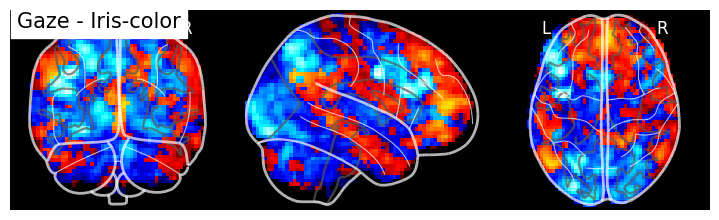

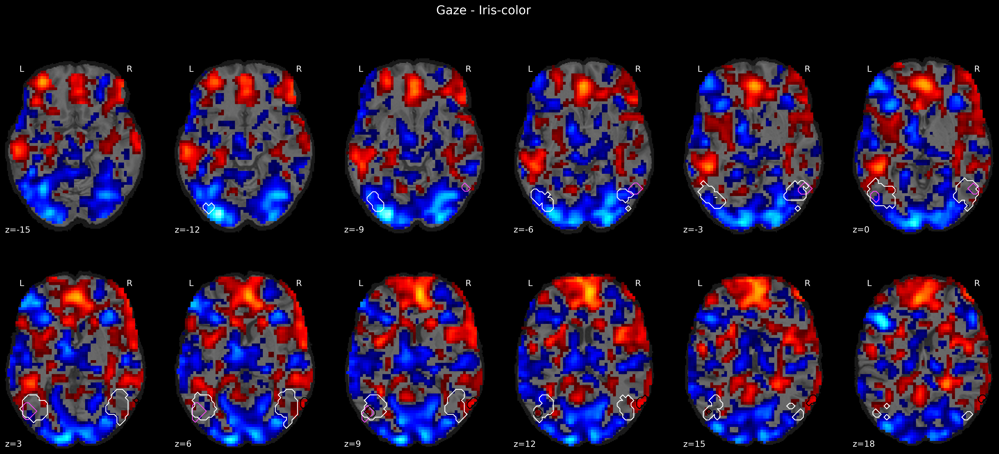

In [11]:
plt.close('all')

for runs_ in ['run-1-2-3-4-5-6']:

    figure_dict = Bunch( 

        gic = Bunch(
            GazeIris = Bunch(
                run_set=runs_, 
                which_map='z-score', 
                fwhm='fwhm-8',
                specs='hrfModel-gdd', 
                alpha=0.5, 
                h_control='fpr', 
                c_threshold=3, 
                vmax=None, 
                colorbar=False,
                cut_coords=np.arange(-15, 20, 3),
                glass=True, 
                plot_kira=True, 
                plot_ind_MT=False, 
                plot_ns_MT=True,
                add_contours=[
                    '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-0000/functional/archive/sub-0000_task-gic_GazeIris-positive_fwhm-5_p0.25-fpr_ROI-mask_GFPneu-left.nii',
                    '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-0000/functional/archive/sub-0000_task-gic_GazeIris-positive_fwhm-5_p0.05-fpr_ROI-mask_GFPneu-right.nii']
            )
        )
    )

    subjects['sub-0000']['ses-com'].plot_glass_and_zcuts(figure_dict, store_=False)
    plt.close('all')


CubesIris
Specs: hrfModel-gdd
Loaded image:  sub-0000_task-gic_run-1-2-3-4-5-6_CubesIris_fwhm-10_cue-aligned_dur-0_hrfModel-gdd_z-score.nii.gz


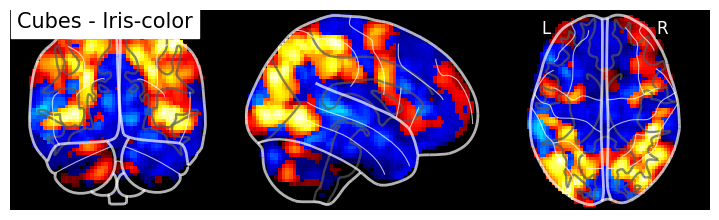

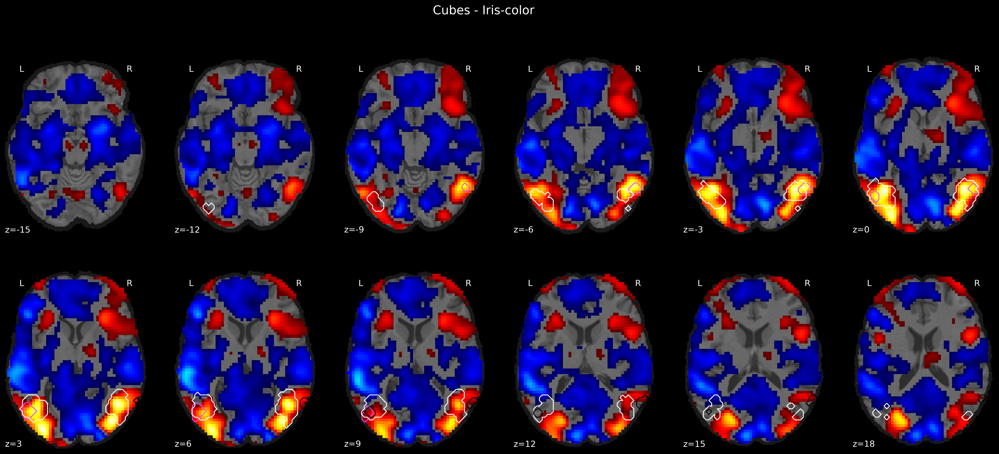

In [8]:
plt.close('all')

for runs_ in ['run-1-2-3-4-5-6']:

    figure_dict = Bunch( 

        gic = Bunch(
            CubesIris = Bunch(
                run_set=runs_, 
                which_map='z-score', 
                fwhm='fwhm-10',
                specs='hrfModel-gdd', 
                alpha=0.1, 
                h_control='fpr', 
                c_threshold=3, 
                vmax=None, 
                colorbar=False,
                cut_coords=np.arange(-15, 20, 3),
                glass=True, 
                plot_kira=True, 
                plot_ind_MT=False, 
                plot_ns_MT=True,
                add_contours=[
                    '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-0000/functional/archive/sub-0000_task-gic_GazeIris-positive_fwhm-5_p0.25-fpr_ROI-mask_GFPneu-left.nii',
                    '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-0000/functional/archive/sub-0000_task-gic_GazeIris-positive_fwhm-5_p0.05-fpr_ROI-mask_GFPneu-right.nii']
            )
        )
    )

    subjects['sub-0000']['ses-com'].plot_glass_and_zcuts(figure_dict, store_=False)
    plt.close('all')


GazeCubes
Specs: hrfModel-gdd
Loaded image:  sub-00_task-gc_run-1-2-3-4-5-6_GazeCubes_fwhm-8_cue-aligned_dur-0_hrfModel-gdd_z-score.nii.gz


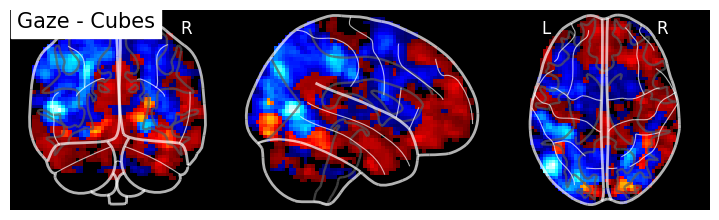

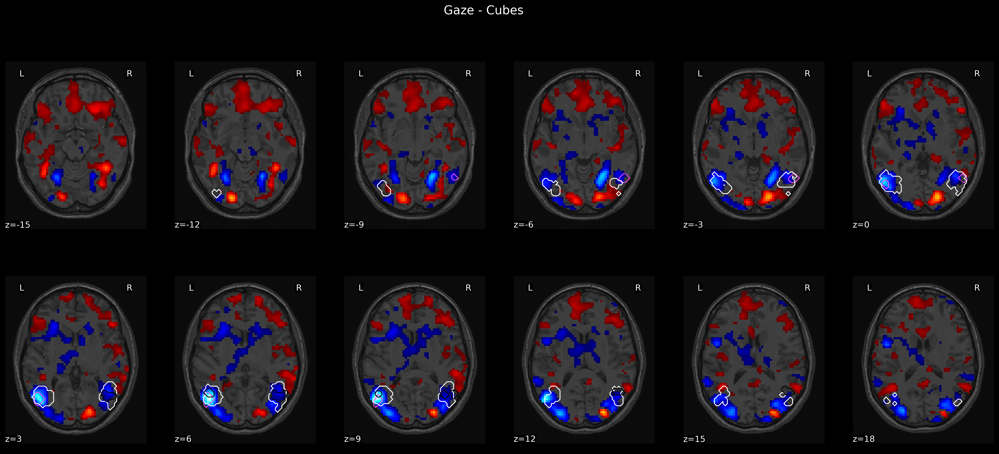

In [10]:
plt.close('all')

for runs_ in ['run-1-2-3-4-5-6']:

    figure_dict = Bunch( 

        gc = Bunch(
            GazeCubes = Bunch(
                run_set=runs_, 
                which_map='z-score', 
                fwhm='fwhm-8',
                specs='hrfModel-gdd', 
                alpha=0.05, 
                h_control='fpr', 
                c_threshold=3, 
                vmax=None, 
                colorbar=False, 
                cut_coords=np.arange(-15, 20, 3),
                glass=True, 
                plot_kira=True, 
                plot_ind_MT=False, 
                plot_ns_MT=True,
                add_contours=[
                    '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-00/functional/sub-00_task-gic_Gaze1Iris123-both_fwhm-5_p0.01-fpr_ROI-mask_GFP-left.nii',
                    '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-00/functional/sub-00_task-gic_Gaze1Iris123-both_fwhm-5_p0.01-fpr_ROI-mask_GFP-right.nii'
                ]
            )
        )
    )

    subjects['sub-00']['ses-gc'].plot_glass_and_zcuts(figure_dict, store_=False)
    plt.close('all')


GazeIris
------------------
Loaded image:  sub-0000_task-gic_run-1-2-3-4-5-6_GazeIris_fwhm-5_cue-aligned_dur-0_hrfModel-gdd_z-score.nii.gz


/home/marius/.virtualenvs/fmri/lib/python3.8/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



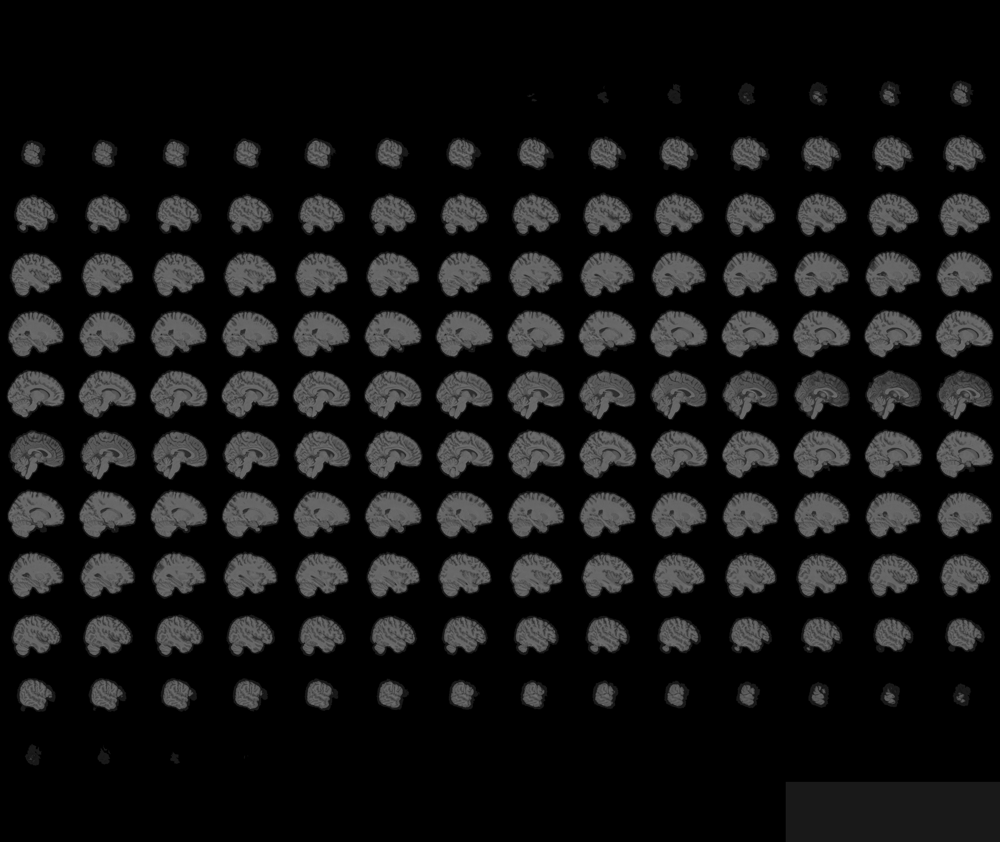
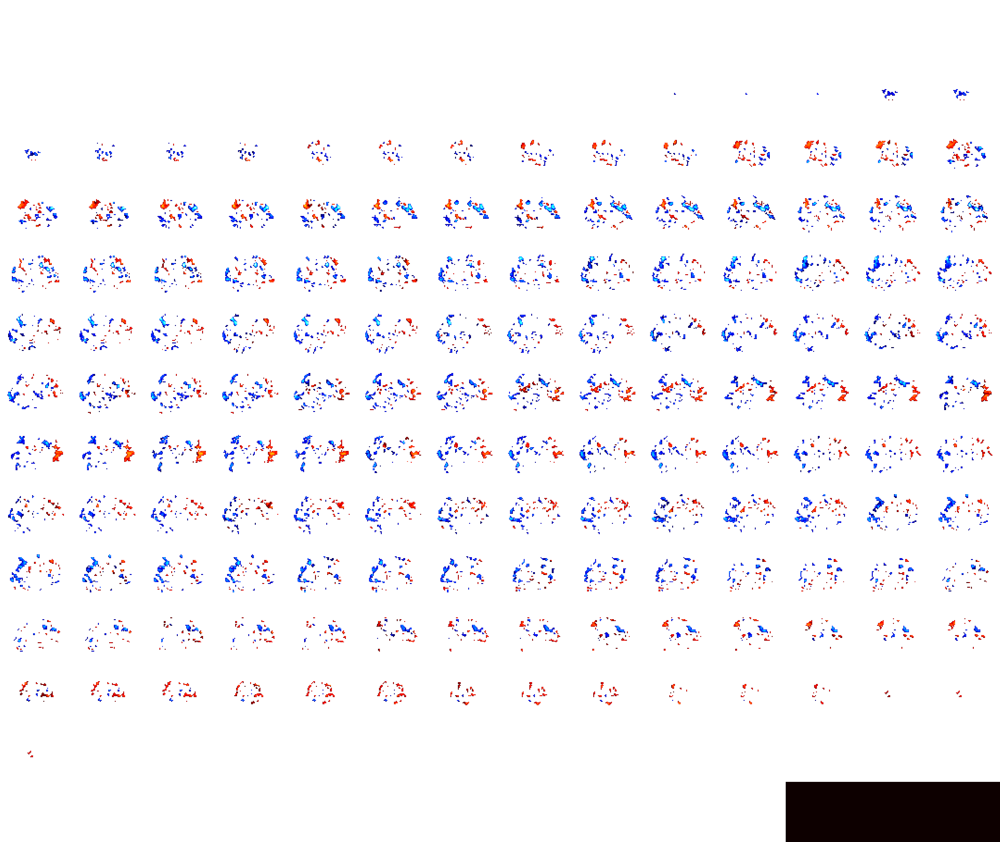

/home/marius/ownCloud/development/python/atlasreader/atlasreader/atlasreader.py:701: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clust_frame.iloc[:, col] = clust_frame.iloc[:, col].astype(float)
/home/marius/ownCloud/development/python/atlasreader/atlasreader/atlasreader.py:702: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  peaks_frame.iloc[:, col] = peaks_frame.iloc[:, col].astype(float)
/home/marius/ownCloud/development/python/atlasreader/atlasreader/atlasreader.py:701: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to

In [32]:
plt.close('all')

for runs_ in ['run-1-2-3-4-5-6']:

    figure_dict = Bunch( 

        gic = Bunch(
            GazeIris = Bunch(
                run_set=runs_, 
                which_map='z-score', 
                fwhm='fwhm-5',
                specs='hrfModel-gdd', 
                alpha=0.05, 
                h_control='fpr', 
                c_threshold=3, 
                vmax=None, 
                colorbar=False, 
                cut_coords=[-60.5, -60.5,   2.5],
                glass=False
            )
        )
    )

    subjects['sub-0000']['ses-com'].interactive_plot(figure_dict)
    plt.close('all')

# Compute ROI masks

['/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/pilot/activations/univariate_contrasts/sub-00/gc/sub-00_task-gc_run-1-2-3-4-5-6_GazeCubes_fwhm-None_cue-aligned_dur-0_hrfModel-gdd_z-score.nii.gz']
*** Coordinates used as reference:  [-51.95   -71.7875   4.3   ] [ 54.59523811 -64.02380951  -3.92857142]
*** LABELS OF LEFT THRESHOLD


/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/subject.py:1666: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  plotting.plot_glass_brain(image.new_img_like(


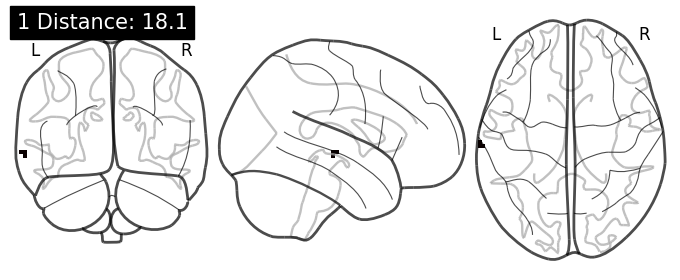

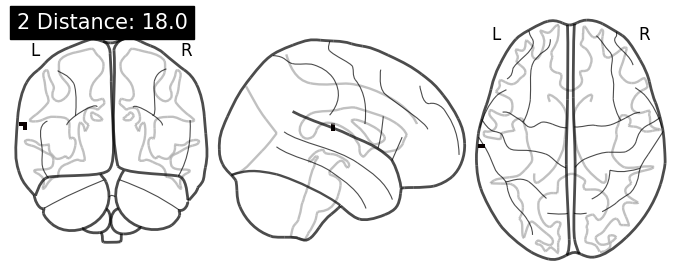

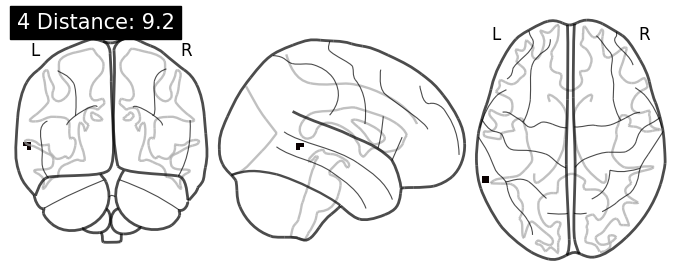

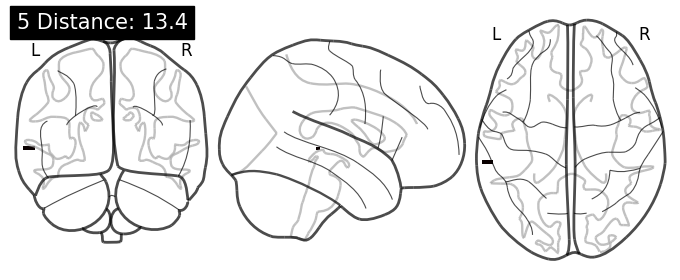

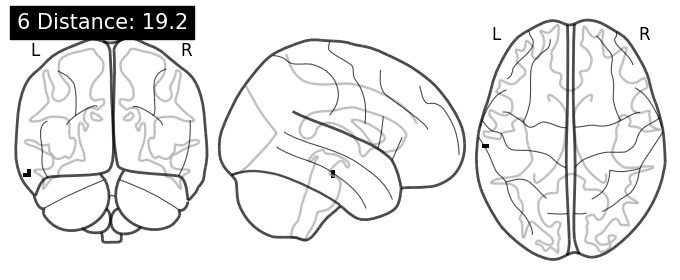

...

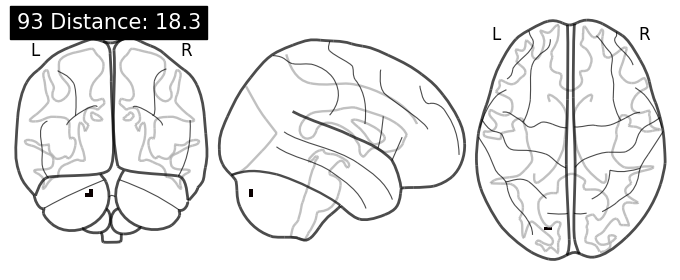

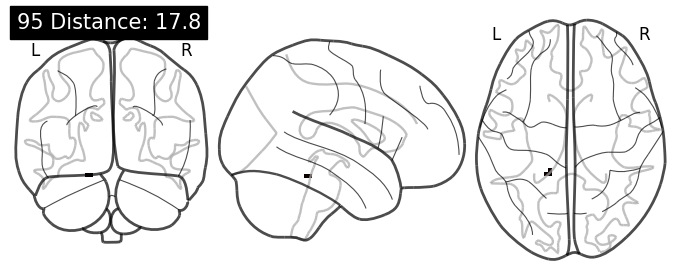

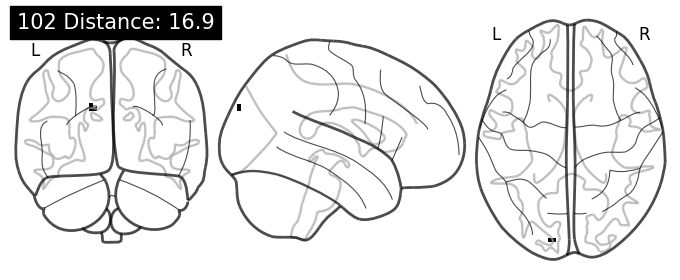

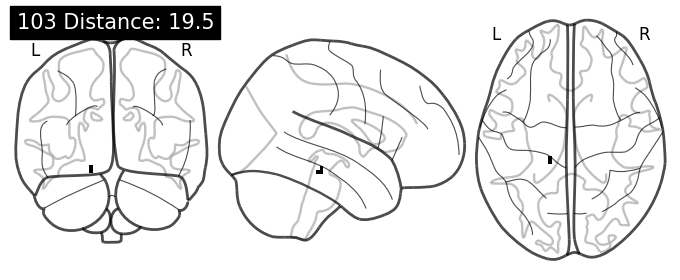

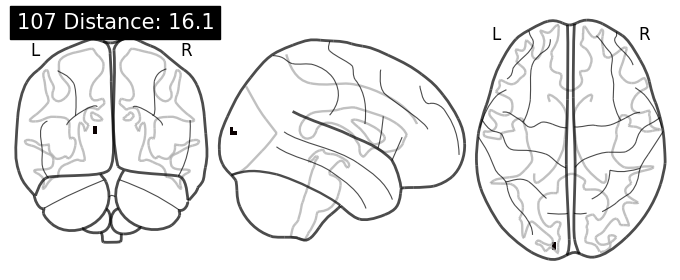


KeyboardInterrupt



In [3]:
sub_id = 'sub-00'
session = 'ses-gc'
task = 'gc'
runs = 'run-1-2-3-4-5-6'
con = 'GazeCubes'
sign = 'positive'

left_arr, \
right_arr, \
left_mask, \
right_mask, \
img_name, \
left_distance_to_ref, \
right_distance_to_ref, \
left_center_coordinates_mni, \
right_center_coordinates_mni = \
subjects[sub_id][session].compute_masks(
    img_=None,
    task=task,
    runs=runs,
    con=con,
    con_specs='hrfModel-gdd',
    sign=sign,
    alpha=[0.05, 0.055], # left, right hemisphere
    h_control=["fpr", "fpr"], # left, right hemisphere
    cluster_threshold=[3, 3], # left, right hemisphere
    fwhm=None,
    ref_img='Marquardt2017', # can be 'MTloc', 'Marquardt2017', list of MNI-coordinates (np.array), or list of mask images
    use_lbls=False, #[21, 194], #[1,1],
    plot_components=True,
    spatial_distance_threshold=20, # False or a value
    store=False,
    roi_name='GFP')

plotting.plot_glass_brain(left_mask, title=left_center_coordinates_mni)
plotting.plot_glass_brain(right_mask, title=right_center_coordinates_mni)

# Make BOLD dataframe

In [6]:
sub_task_dict[sub_id][ses_][task_]

{'conditions': ['Gaze', 'Cubes'],
 'runs': ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6'],
 'subject_type': 'pilot'}

In [23]:

data_collector = []

average_rois = True

sub_task_dict = {
    'sub-00': {
        'ses-gc': {
            'gc': {
                'conditions': ['Gaze', 'Cubes'], 
                'runs': ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6'],
                'subject_type': 'pilot'
            }
        },
        'ses-com': {
            'gic': {
                'conditions': ['Gaze', 'Cubes', 'Iris'], 
                'runs': ['run-1', 'run-2', 'run-3'],
                'subject_type': 'pilot'
            }
        }
    }, 
    'sub-0000': {
        'ses-com': { 
            'gic': { 
                'conditions': ['Gaze', 'Cubes', 'Iris'], 
                'runs': ['run-1', 'run-2', 'run-3', 'run-4', 'run-5', 'run-6'],
                'subject_type': 'pilot'
            }
        },
        # 'ses-sep': { 
        #     'co': { 
        #         'conditions': ['Cubes1', 'Cubes2', 'Cubes3'], 
        #         'runs': ['run-1', 'run-2', 'run-3'],
        #         'subject_type': 'pilot'
        #     },
        #     'go': { 
        #         'conditions': ['Gaze1', 'Gaze2', 'Gaze3'], 
        #         'runs': ['run-1', 'run-2', 'run-3'],
        #         'subject_type': 'pilot'
        #     }
        # }
    }
}

fwhm = '5' # None, 5
img_type = 'z-score'#'z_score', 'effect_size'

run_cntr = 0 # make nesting explicit

for sub_id in sub_task_dict.keys():
    print()
    print('***', sub_id)
    
    for ses_ in sub_task_dict[sub_id].keys():
        print('\t', ses_)
        
        for task_ in sub_task_dict[sub_id][ses_]:
            
            for run_ in sub_task_dict[sub_id][ses_][task_]['runs']:
                run_cntr += 1
                print('\t\t', run_cntr)
                    
                for cond in sub_task_dict[sub_id][ses_][task_]['conditions']:
                    print('\t\t\t', cond)

                    for roi_type in subjects[sub_id][ses_].info.ROIs:

                        if roi_type in ['functional', 'other']: 
                            
                            for roi_name in subjects[sub_id][ses_].info.ROIs[roi_type]:
                                # print('\t\t', roi_name)

                                for roi_img in subjects[sub_id][ses_].info.ROIs[roi_type][roi_name]:

                                    #
                                    if 'left' in roi_img:
                                        hemi_ = 'LH'
                                    elif 'right' in roi_img:
                                        hemi_ = 'RH'
                                    #

                                    # make sure nesting of runs is explicit
                                    if len(str(run_cntr)) == 1:
                                        run__ = run_[:-1]+'00'+str(run_cntr)
                                    elif len(str(run_cntr)) == 2:
                                        run__ = run_[:-1]+'0'+str(run_cntr)
                                    elif len(str(run_cntr)) == 3:
                                        run__ = run_[:-1]+str(run_cntr)

                                    map_ = [el for el in subjects[sub_id][ses_].univariate.results[task_][run_][cond]['fwhm-'+str(fwhm)] if img_type in el]
                                    roi_vals = apply_mask(map_, mask_img=roi_img)[0]
                                    
                                    # collect individual voxel values instead of averages
                                    if not average_rois:
                                        for vox_i, vox_val in enumerate(roi_vals):
                                            if vox_val == 0:
                                                print(sub_id, ses_, task_, run_, cond, roi_name, vox_i)
                                            data_collector.append([sub_id, sub_task_dict[sub_id][ses_][task_]['subject_type'], task_, run__, roi_name, hemi_, cond, vox_i, vox_val, 'beta_z-score'])
                                    
                                    # sub_id | subject_type | task1 | task2 | run1 | run2 | roi1 | roi2 | hemisphere | condition1 | condition2 | y | y_type 
                                    # data_collector.append([sub_id, sub_task_dict[sub_id][ses_][task_]['subject_type'], task_, np.NaN, run_, np.NaN, roi_name, np.NaN, hemi_, cond, np.NaN, value_[0], 'beta_z-score'])
                                    
                                    # sub_id | subject_type | task1 | run | roi | hemisphere | condition | y | y_type 
                                    if average_rois:
                                        value_ = np.mean(roi_vals)
                                        data_collector.append([sub_id, sub_task_dict[sub_id][ses_][task_]['subject_type'], task_, run__, roi_name, hemi_, cond, value_, 'beta_z-score'])



*** sub-00
	 ses-gc
		 1
			 Gaze
			 Cubes
		 2
			 Gaze
			 Cubes
		 3
			 Gaze
			 Cubes
		 4
			 Gaze
			 Cubes
		 5
			 Gaze
			 Cubes
		 6
			 Gaze
			 Cubes
	 ses-com
		 7
			 Gaze
			 Cubes
			 Iris
		 8
			 Gaze
			 Cubes
			 Iris
		 9
			 Gaze
			 Cubes
			 Iris

*** sub-0000
	 ses-com
		 10
			 Gaze
			 Cubes
			 Iris
		 11
			 Gaze
			 Cubes
			 Iris
		 12
			 Gaze
			 Cubes
			 Iris
		 13
			 Gaze
			 Cubes
			 Iris
		 14
			 Gaze
			 Cubes
			 Iris
		 15
			 Gaze
			 Cubes
			 Iris


In [25]:


# individual voxel values
# df = pd.DataFrame(data_collector, columns=['participant', 'subject_type', 'task', 'run', 'roi', 'hemisphere', 'condition', 'voxel_id', 'y', 'type_of_y'])


# averaged across voxels
df = pd.DataFrame(data_collector, columns=['participant', 'subject_type', 'task', 'run', 'roi', 'hemisphere', 'condition', 'y', 'type_of_y'])


In [9]:
df

,participant,subject_type,task,run,roi,hemisphere,condition,y,type_of_y
0,sub-00,pilot,gc,run-001,GFP,LH,Gaze,-0.588890,beta_z-score
1,sub-00,pilot,gc,run-001,GFP,RH,Gaze,2.288840,beta_z-score
2,sub-00,pilot,gc,run-001,fMotionArea,LH,Gaze,0.510831,beta_z-score
3,sub-00,pilot,gc,run-001,fMotionArea,RH,Gaze,1.459337,beta_z-score
4,sub-00,pilot,gc,run-001,Marquardt2017GFP,LH,Gaze,0.022778,beta_z-score
5,sub-00,pilot,gc,run-001,Marquardt2017GFP,RH,Gaze,0.759252,beta_z-score
6,sub-00,pilot,gc,run-001,GFP,LH,Cubes,0.274638,beta_z-score
7,sub-00,pilot,gc,run-001,GFP,RH,Cubes,2.287884,beta_z-score
8,sub-00,pilot,gc,run-001,fMotionArea,LH,Cubes,0.816045,beta_z-score
9,sub-00,pilot,gc,run-001,fMotionArea,RH,Cubes,1.540898,beta_z-score


In [26]:
fp = '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/data/pilot/beta_values/gm-dat_fwhm-5_z-scores_newROIs.csv'
df.to_csv(fp, sep='\t', index=False)

# Find closest peak to reference

In [5]:
sys.path.append( sys.path.append('/home/marius/ownCloud/development/python/atlasreader/atlasreader') )
import atlasreader

In [17]:
subjects['sub-0000']['ses-com'].univariate.results.gic['run-1-2-3-4-5-6']['GazeIris']['fwhm-5'][0]

'/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/pilot/activations/univariate_contrasts/sub-0000/gic/sub-0000_task-gic_run-1-2-3-4-5-6_GazeIris_fwhm-5_cue-aligned_dur-0_hrfModel-gdd_z-score.nii.gz'

/home/marius/ownCloud/development/python/atlasreader/atlasreader/atlasreader.py:701: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clust_frame.iloc[:, col] = clust_frame.iloc[:, col].astype(float)
/home/marius/ownCloud/development/python/atlasreader/atlasreader/atlasreader.py:702: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  peaks_frame.iloc[:, col] = peaks_frame.iloc[:, col].astype(float)
/home/marius/ownCloud/development/python/atlasreader/atlasreader/atlasreader.py:701: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to

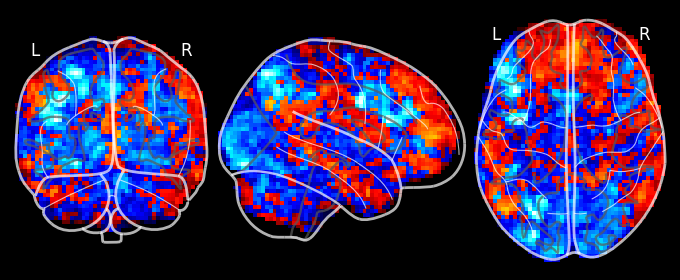

In [6]:
img = subjects['sub-0000']['ses-com'].univariate.results.gic['run-1-2-3-4-5-6']['GazeIris']['fwhm-5'][0]

thr_map, _ = threshold_stats_img(img, alpha=1, height_control='fpr', cluster_threshold=3)
plotting.plot_glass_brain(thr_map, plot_abs=False, black_bg=True)

clust_frame, peaks_frame = atlasreader.create_output(
                    thr_map, cluster_extent=0)

In [21]:
marquardt2017gfp_left = [-55, -68,   1]
marquardt2017gfp_right = [50, -64,   -3]


print(gma.helpers.nearest_local_maximum(
    peaks_frame,
    marquardt2017gfp_left, 
    sign='positive'))

print(gma.helpers.nearest_local_maximum(
    peaks_frame,
    marquardt2017gfp_right, 
    sign='positive'))

('253', array([-60.5, -60.5,   2.5]), 2.3177947998046875)
('297', array([ 38.5, -60.5,  -6.5]), 2.0924088954925537)


# Make ROI mask image from seed coordinates

In [11]:
from nilearn.maskers import nifti_spheres_masker
from nilearn import maskers

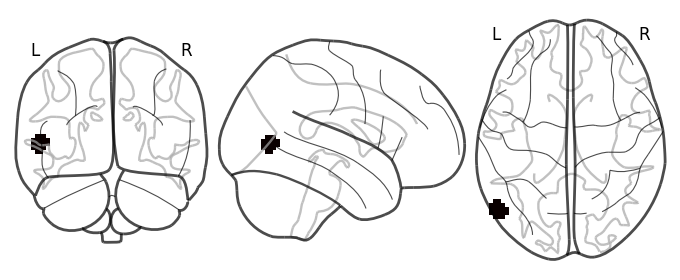

In [24]:
seeds = [[-55, -70, 3]]
radius = 7
mask_img = subjects['sub-0000']['ses-com'].info.func['MTloc']['MTloc_run-1'].mask

# apply sphere masking on the mask
_, X = nifti_spheres_masker._apply_mask_and_get_affinity(seeds=seeds,
                                    niimg=None,
                                    radius=radius,
                                    allow_overlap=True,
                                    mask_img=mask_img
                                    )

# inverse-transform X that contains masked images with spheres
masker = maskers.NiftiMasker(mask_img=mask_img)
masker.fit()
img = masker.inverse_transform(np.sum(X,axis=0).A.ravel())

# show results
plotting.plot_glass_brain(img)
# img.to_filename('/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/analysis/gm_analysis/src/ROIs/individual/sub-0000/functional/sub-0000_task-gic_GazeIris-positive_fwhm-5_p0.2-fpr_ROI-mask_GFP-left.nii')

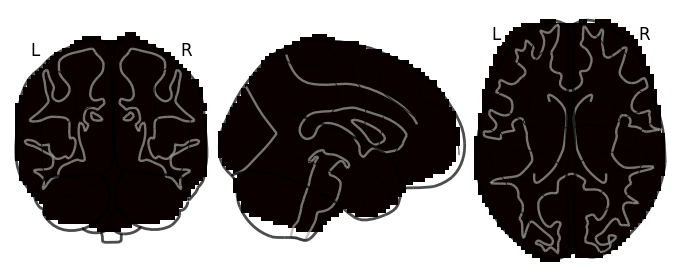

In [ ]:
plotting.plot_glass_brain(subjects['sub-0000']['ses-com'].info.func['MTloc']['MTloc_run-1'].mask)

# Archive

## MT

In [ ]:
# sub_id = "sub-000"
# # specify which MT-contrasts should be used
# alpha = 1e-3
# h_control = "fdr"
# fwhm = 5

# subjects[sub_id].compute_masks(alpha=alpha, h_control=h_control, fwhm=fwhm)

In [ ]:
# plotting.plot_glass_brain(
#     image.math_img(
#         'a+b', 
#         a='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/ROIs/sub-000/sub-000_task-MTloc_MotionStatic_fwhm-None_p0.001-fdr_ROI-mask_fMT-left.nii', 
#         b='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/ROIs/sub-000/sub-000_task-MTloc_MotionStatic_fwhm-None_p0.001-fdr_ROI-mask_fMT-right.nii'))

In [ ]:
# plotting.plot_glass_brain(
#     image.math_img(
#         'a+b', 
#         a='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/ROIs/sub-000/sub-000_task-MTloc_MotionStatic_fwhm-5_p0.001-fdr_ROI-mask_fMT-left.nii', 
#         b='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/ROIs/sub-000/sub-000_task-MTloc_MotionStatic_fwhm-5_p0.001-fdr_ROI-mask_fMT-right.nii'))

### Manual

In [ ]:
# source_img = '/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-eic_Eyes1Cubes123_fwhm-5_z_score.nii'

# alpha = 0.05
# h_control = 'fdr'
# left_ref = np.array([16.51, 20.21, 29.05])
# right_ref = np.array([57, -53, 20])

# thresholded_map, threshold = threshold_stats_img(
#                 source_img, alpha=alpha,
#                 height_control=h_control,
#                 cluster_threshold=5)
# img_binaries = image.get_data(image.math_img('a>0', a=thresholded_map)).astype(bool)

# labels, nlabels = ndimage.label(img_binaries)
# found_left = 0
# found_right = 0

# for lbl in range(nlabels):
#     # left_MT_mask = image.new_img_like(img, (labels == lbl).astype(int))
#     # plotting.plot_glass_brain(left_MT_mask)
#     loc = np.mean(np.where((labels == lbl+1).astype(int)), axis=1)
#     print(loc)
#     if np.abs(np.sum(loc-left_ref)) < 1.5:
#         left_id = lbl+1
#         found_left += 1
#     if np.abs(np.sum(loc-right_ref)) < 1.5:
#         right_id = lbl+1
#         found_right += 1

# if found_right > 1:
#     print("***WARNING*** more than 1 ROIs were identified. Check manual!")
# if found_right == 0:
#     print("***WARNING*** no ROI was found. Check manual!")

# # left_mask = image.new_img_like(source_img, (labels == leftMT_id).astype(int))
# # right_mask = image.new_img_like(source_img, (labels == rightMT_id).astype(int))
    
# # left_mask = image.new_img_like(source_img, (labels == 2).astype(int))
# right_mask = image.new_img_like(source_img, (labels == 62).astype(int))

# #
# # left_mask.to_filename( source_img[:-4]+'_'+h_control+'_'+str(alpha)+'_mask_left.nii' )
# # right_mask.to_filename( source_img[:-4]+'_'+h_control+'_'+str(alpha)+'_mask_right.nii' )

In [ ]:
# plotting.plot_glass_brain(image.new_img_like(source_img, labels), black_bg=True)

In [ ]:
# plotting.plot_glass_brain(image.new_img_like(source_img, (labels == 20).astype(int)), black_bg=True)

In [ ]:
# plotting.plot_glass_brain(image.new_img_like(source_img, (labels == leftMT_id).astype(int)), black_bg=True)

In [ ]:
# plotting.plot_glass_brain(right_mask, black_bg=True)

In [ ]:
# source_img

'/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-00/sub-00_task-ec_EyesCubes_fwhm-5_z_score.nii'

In [ ]:
# source_img[:-43]+'Conjunction_'+source_img[-34:-4]+'_'+h_control+'_'+str(alpha)+'_mask_rightTPJ2.nii'

'/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-00/Conjunction_sk-ec_EyesCubes_fwhm-5_z_score_fdr_0.05_mask_rightTPJ2.nii'

In [ ]:
# right_mask.to_filename( source_img[:-4]+'_'+h_control+'_'+str(alpha)+'_mask_rightTPJ2.nii' )


In [ ]:
# source_img[:-4]

'/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocRotation_MotionStatic_fwhm-None_z_score'

In [ ]:
# source_img[-34:-4]

'MotionStatic_fwhm-None_z_score'

In [ ]:
# conj_img_left = image.math_img(
#         'b+c+e', 
#         b='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocRotation_MotionStatic_fwhm-None_z_score_fdr_0.001_mask_left.nii',
#         c='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocCubes_MotionStatic_fwhm-None_z_score_fdr_0.001_mask_left.nii',
#         e='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocRandom_MotionStatic_fwhm-None_z_score_fdr_0.001_mask_left.nii',
#     ) 

# conj_img_right = image.math_img(
#         'a+d+f', 
#         a='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocRotation_MotionStatic_fwhm-None_z_score_fdr_0.001_mask_right.nii', 
#         d='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocCubes_MotionStatic_fwhm-None_z_score_fdr_0.001_mask_right.nii',
#         f='/home/marius/ownCloud/PhD/projects/scientific/gaze-motion/results/from_nilearn/univariate_contrasts/sub-000/sub-000_task-MTlocRandom_MotionStatic_fwhm-None_z_score_fdr_0.001_mask_right.nii'
#     ) 

# conj_mask_left = image.math_img('a>0', a=conj_img_left)
# conj_mask_right = image.math_img('a>0', a=conj_img_right)
# conj_mask_left.to_filename( source_img[:-43]+'Conjunction_'+source_img[-34:-4]+h_control+'_'+str(alpha)+'_mask_left.nii' )
# conj_mask_right.to_filename( source_img[:-43]+'Conjunction_'+source_img[-34:-4]+h_control+'_'+str(alpha)+'_mask_right.nii' )

# # plotting.plot_glass_brain(
# #     conj_mask)

